In [1]:
import __casac__ as cc
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astropy.io import fits as pf
from dsacalib.utils import *
from dsacalib.calib import * 
from dsacalib.plotting import *
from dsacalib.fringestopping import *
%matplotlib inline

In [2]:
# Define the file, source and pointing parameters
datadir= '/home/simard/dsa_calib/data'
fl     = '{0}/J1459+7140/flagged.fits'.format(datadir) 
cal    = src('J1459+7140','14h59m07.63s','+71d40m19.9s',7.47)
sr0    = src('J1520+7225','15h20m47.46s','+72d25m04.80s',1.5491)
antenna_order = [8,5,7,4,3,0,9,1,6,2]
nant   = len(antenna_order)

## Find calibration solutions using calibrator

In [3]:
fobs, blen, bname, tstart, tstop, vis, mjd, transit_idx = \
    read_psrfits_file(fl,cal,dur=50*u.min,
                      antpos='{0}/antpos_ITRF.txt'
                      .format(datadir))

File covers 1.01 h hours from MJD 58753.925137845064 to 58753.96714612979


In [4]:
divide_visibility_sky_model(vis,blen,[cal],mjd,fobs)

#### Write 10-s fringe-stopped visibilities to ms

In [5]:
convert_to_ms(cal,vis,tstart,'{0}.ms'.format(cal.name),bname,
             antpos='{0}/antpos_ITRF.txt'.format(datadir),tsamp=ct.tsamp,
             nint=25)

#### Delay calibration

In [6]:
delay_calibration(cal.name,cal.name)

#### Use deviations from average delay calibration to flag bad times

In [7]:
bad_times,times = get_bad_times(cal.name,cal.name,nant)
flag_badtimes(cal.name,times,bad_times,nant)

opening J1459+7140_J1459+7140_2kcal
opening J1459+7140_J1459+7140_kcal


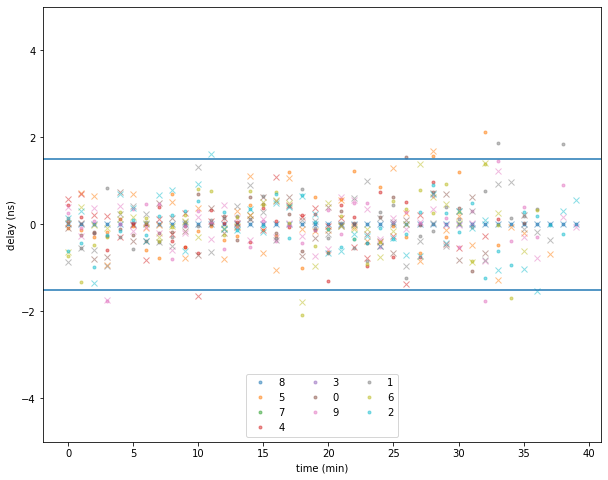

In [8]:
times, antenna_delays, kcorr = plot_antenna_delays(
    cal.name,cal.name,antenna_order)

#### Flag antennas that we know are bad and short baselines with crosstalk

In [9]:
flag_antenna(cal.name,4)
flag_antenna(cal.name,2)
flag_antenna(cal.name,"3,5,7,9&")

#### Gain calibration

In [10]:
gain_calibration(cal.name,cal.name)

#### Look at solutions

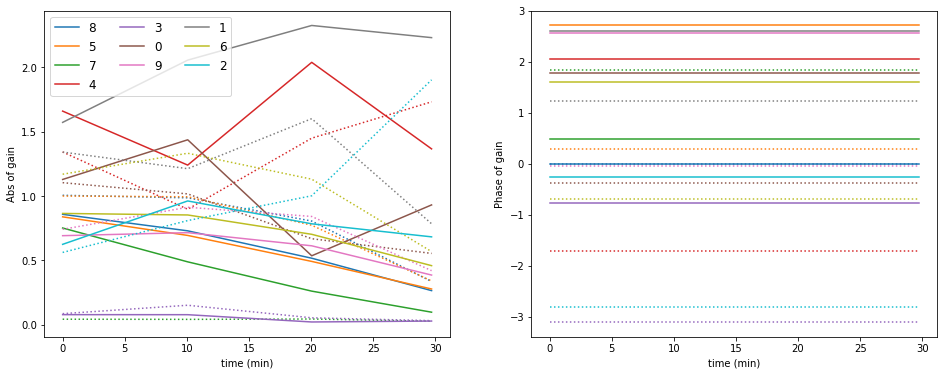

In [11]:
plot_gain_calibration(cal.name,cal.name,antenna_order)

Image shape: [256 256   1   1]
Peak SNR at pix (130,129) = 5.131438149474876
Value at peak: 1.0538737773895264
Value at origin: 1.0453177690505981
1 errors occured during imaging


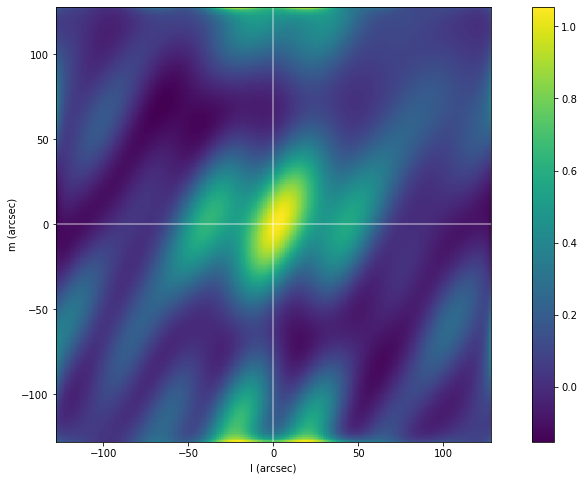

In [12]:
plot_image(cal.name,'corrected',cal,verbose=True)

## Apply solution to target source

In [13]:
fobs, blen, bname, tstart, tstop, vis, mjd, transit_idx = \
    read_psrfits_file(fl,sr0,dur=5*u.min,
                      antpos='{0}/antpos_ITRF.txt'
                      .format(datadir))

File covers 1.01 h hours from MJD 58753.925137845064 to 58753.96714612979


In [14]:
divide_visibility_sky_model(vis,blen,[sr0],mjd,fobs,phase_only=True)

In [15]:
convert_to_ms(sr0,vis,tstart,'{0}.ms'.format(sr0.name),bname,
              tsamp=ct.tsamp,nint=25,
              antpos='{0}/antpos_ITRF.txt'.format(datadir))

#### Flag bad antennas and short baselines

In [16]:
flag_antenna(sr0.name,4)
flag_antenna(sr0.name,2)
flag_antenna(sr0.name,"3,5,7,9&")

#### Calibrate

In [17]:
apply_calibration(sr0.name,cal.name,msnamecal=cal.name)

#### Look at calibrated data

In [18]:
ms = cc.ms.ms()
ms.open('{0}.ms'.format(sr0.name))
data = ms.getdata(['corrected_data'])
vis_cal = data['corrected_data'].reshape(2,625,-1,45).T
ms.close()
mjd = np.mean(mjd[:25])+np.arange(vis_cal.shape[1])*np.median(np.diff(mjd))*25

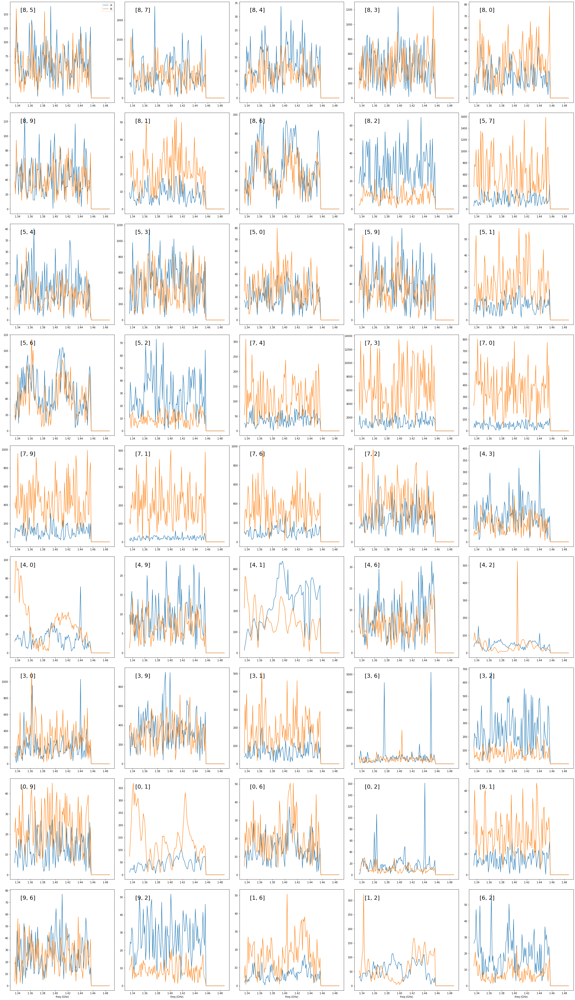

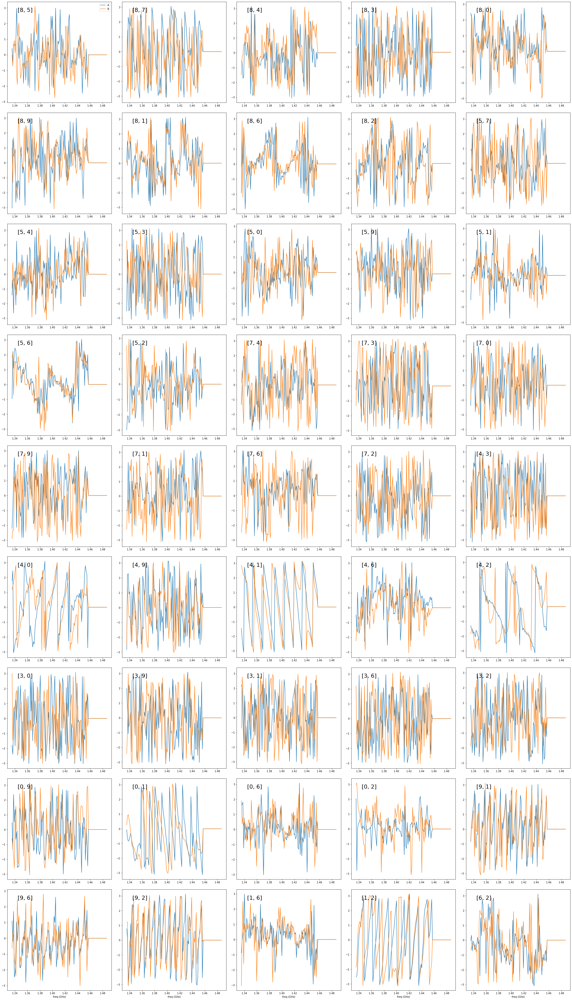

In [19]:
plot_vis_freq(vis_cal,fobs,bname)

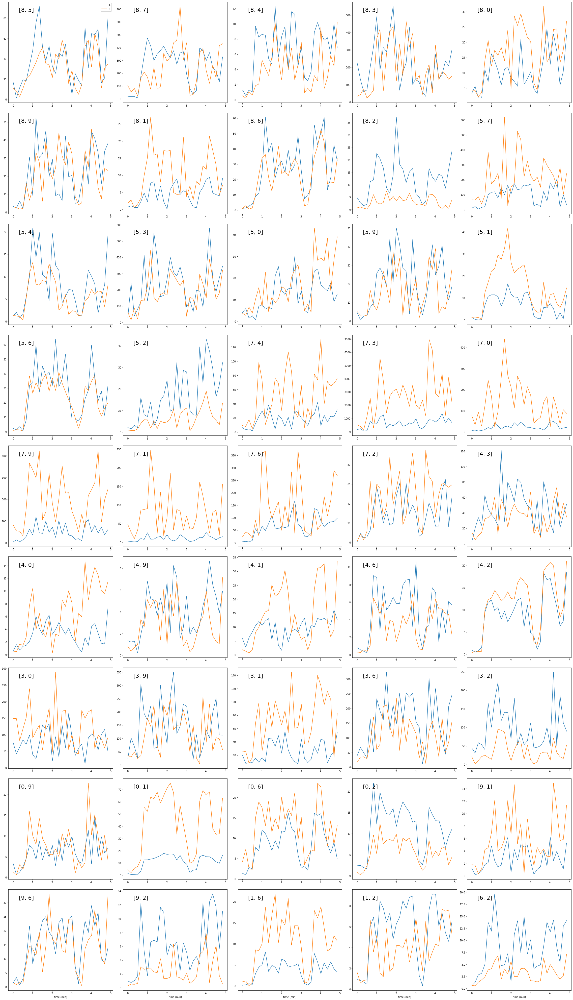

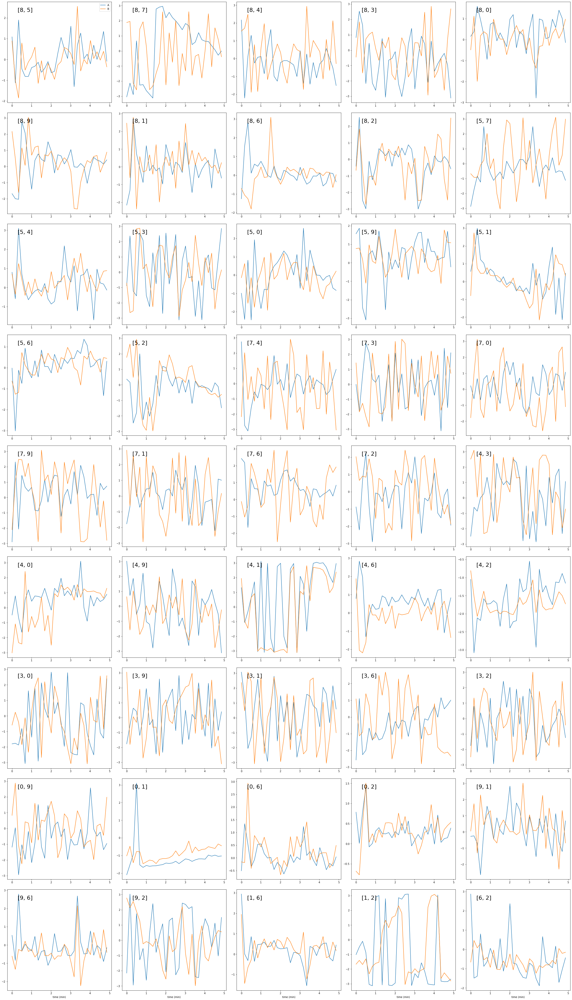

In [20]:
plot_vis_time(vis_cal,mjd,bname)

Image shape: [128 128   1   1]
Peak SNR at pix (61,67) = 3.2493399878962688
Value at peak: 9.862887382507324
Value at origin: 9.564506530761719
1 errors occured during imaging


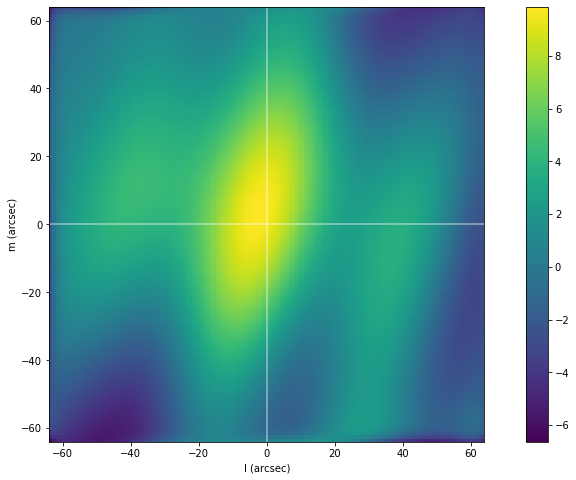

In [21]:
plot_image('{0}'.format(sr0.name),'corrected',sr0,verbose=True,
          npix=128)

Image shape: [256 256   1   1]
Peak SNR at pix (144,0) = 4.221698001435674
Value at peak: 13.71300983428955
Value at origin: 9.564248085021973
1 errors occured during imaging


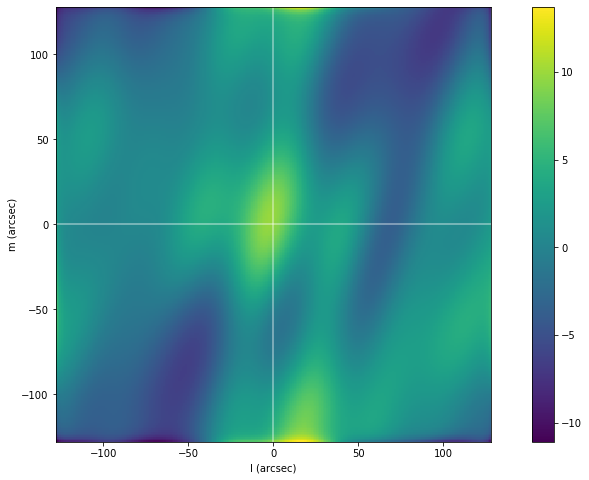

In [22]:
plot_image('{0}'.format(sr0.name),'corrected',sr0,verbose=True)